## DOMAIN:
Semiconductor manufacturing process



## CONTEXT: 

A complex modern semiconductor manufacturing process is normally under constant surveillance via the monitoring of
signals/variables collected from sensors and or process measurement points. However, not all of these signals are equally valuable in a
specific monitoring system. The measured signals contain a combination of useful information, irrelevant information as well as noise.
Engineers typically have a much larger number of signals than are actually required. If we consider each type of signal as a feature, then
feature selection may be applied to identify the most relevant signals. The Process Engineers may then use these signals to determine key
factors contributing to yield excursions downstream in the process. This will enable an increase in process throughput, decreased time to
learning and reduce the per unit production costs. These signals can be used as features to predict the yield type. And by analysing and
trying out different combinations of features, essential signals that are impacting the yield type can be identified.



# DATA DESCRIPTION: 
sensor-data.csv : (1567, 592)
The data consists of 1567 datapoints each with 591 features.
The dataset presented in this case represents a selection of such features where each example represents a single production entity with
associated measured features and the labels represent a simple pass/fail yield for in house line testing. Target column “ –1” corresponds to
a pass and “1” corresponds to a fail and the data time stamp is for that specific test point.




## PROJECT OBJECTIVE: 

We will build a classifier to predict the Pass/Fail yield of a particular process entity and analyse whether all the
features are required to build the model or not.

### 1. Import and understand the data. 

In [5]:
import pandas as pd
import numpy as np
from sklearn.impute import SimpleImputer
import matplotlib.pyplot as plt
import seaborn as sns
from imblearn.over_sampling import SMOTE
from sklearn.decomposition import PCA
from sklearn.model_selection import train_test_split
from sklearn import svm
from sklearn.metrics import accuracy_score,confusion_matrix,recall_score,classification_report,roc_auc_score,roc_curve
from sklearn.pipeline import Pipeline
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import GradientBoostingClassifier
from xgboost import XGBClassifier
from sklearn.model_selection import StratifiedKFold
import pickle

In [6]:
#A. Import ‘signal-data.csv’ as DataFrame.
print("----Signal data----\n")
Signaldf=pd.read_csv('signal-data.csv')
print("Shape",Signaldf.shape)
Signaldf.head()

----Signal data----

Shape (1567, 592)


,Time,0,1,2,3,4,5,6,7,8,...,581,582,583,584,585,586,587,588,589,Pass/Fail
0,2008-07-19 11:55:00,3030.93,2564.00,2187.7333,1411.1265,1.3602,100.0,97.6133,0.1242,1.5005,...,NaN,0.5005,0.0118,0.0035,2.3630,NaN,NaN,NaN,NaN,-1
1,2008-07-19 12:32:00,3095.78,2465.14,2230.4222,1463.6606,0.8294,100.0,102.3433,0.1247,1.4966,...,208.2045,0.5019,0.0223,0.0055,4.4447,0.0096,0.0201,0.0060,208.2045,-1
2,2008-07-19 13:17:00,2932.61,2559.94,2186.4111,1698.0172,1.5102,100.0,95.4878,0.1241,1.4436,...,82.8602,0.4958,0.0157,0.0039,3.1745,0.0584,0.0484,0.0148,82.8602,1
3,2008-07-19 14:43:00,2988.72,2479.90,2199.0333,909.7926,1.3204,100.0,104.2367,0.1217,1.4882,...,73.8432,0.4990,0.0103,0.0025,2.0544,0.0202,0.0149,0.0044,73.8432,-1
4,2008-07-19 15:22:00,3032.24,2502.87,2233.3667,1326.5200,1.5334,100.0,100.3967,0.1235,1.5031,...,NaN,0.4800,0.4766,0.1045,99.3032,0.0202,0.0149,0.0044,73.8432,-1


In [7]:
#B. Print 5 point summary and share at least 2 observations
Signaldf.describe(include='all')

,Time,0,1,2,3,4,5,6,7,8,...,581,582,583,584,585,586,587,588,589,Pass/Fail
count,1567,1561.000000,1560.000000,1553.000000,1553.000000,1553.000000,1553.0,1553.000000,1558.000000,1565.000000,...,618.000000,1566.000000,1566.000000,1566.000000,1566.000000,1566.000000,1566.000000,1566.000000,1566.000000,1567.000000
unique,1534,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
top,2008-10-15 01:52:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,NaN,3014.452896,2495.850231,2200.547318,1396.376627,4.197013,100.0,101.112908,0.121822,1.462862,...,97.934373,0.500096,0.015318,0.003847,3.067826,0.021458,0.016475,0.005283,99.670066,-0.867262
std,NaN,73.621787,80.407705,29.513152,441.691640,56.355540,0.0,6.237214,0.008961,0.073897,...,87.520966,0.003404,0.017180,0.003720,3.578033,0.012358,0.008808,0.002867,93.891919,0.498010
min,NaN,2743.240000,2158.750000,2060.660000,0.000000,0.681500,100.0,82.131100,0.000000,1.191000,...,0.000000,0.477800,0.006000,0.001700,1.197500,-0.016900,0.003200,0.001000,0.000000,-1.000000
25%,NaN,2966.260000,2452.247500,2181.044400,1081.875800,1.017700,100.0,97.920000,0.121100,1.411200,...,46.184900,0.497900,0.011600,0.003100,2.306500,0.013425,0.010600,0.003300,44.368600,-1.000000
50%,NaN,3011.490000,2499.405000,2201.066700,1285.214400,1.316800,100.0,101.512200,0.122400,1.461600,...,72.288900,0.500200,0.013800,0.003600,2.757650,0.020500,0.014800,0.004600,71.900500,-1.000000
75%,NaN,3056.650000,2538.822500,2218.055500,1591.223500,1.525700,100.0,104.586700,0.123800,1.516900,...,116.539150,0.502375,0.016500,0.004100,3.295175,0.027600,0.020300,0.006400,114.749700,-1.000000


In [8]:
Signaldf.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1567 entries, 0 to 1566
Columns: 592 entries, Time to Pass/Fail
dtypes: float64(590), int64(1), object(1)
memory usage: 7.1+ MB


<b> Observations</b>

1. variables are in different range , need to scale the data.
2. some of the Features seems to be skewed and there are lot of outliers in the data.
3. Data have high percentage of null values. Based on threshold limit some of the null features need to be removed and some of the features with negligible amount of null values should be imputed.
4. Standard deviation of some feature are very high [Eg. feature 3 have SD of 441.69 ].
5. There are feature with 0 standard deviation implies same constant for all the rows of feature [Eg. Feature=5]

### 2. Data cleansing:

In [9]:
#A. Write a for loop which will remove all the features with 20%+ Null values and impute rest with mean of the feature.
featurewithnull=0
feature_morethan20per_null=0
removedfeature=[]

for feature in Signaldf.columns:
    
    #if data missing
    if(Signaldf[feature].isnull().sum()):
        featurewithnull=featurewithnull+1
        missing_per=round((Signaldf[feature].isnull().sum()/len(Signaldf[feature]))*100,2)
        
        #Missing percentage >= 20
        if(missing_per>=20):
            feature_morethan20per_null=feature_morethan20per_null+1
            Signaldf=Signaldf.drop(feature, axis=1)
            removedfeature.append(feature)
            
         #Missing percentage < 20 imputing with mean
        else:
            Signaldf[feature].fillna( round(Signaldf[feature].mean(),4), inplace=True)
            
print("Number of feature which has null values",featurewithnull)
print("Number of feature which has more than 20 percentage null values",feature_morethan20per_null)
print("Shape after missing value treatment ",Signaldf.shape)

Number of feature which has null values 538
Number of feature which has more than 20 percentage null values 32
Shape after missing value treatment  (1567, 560)


In [10]:
#B. Identify and drop the features which are having same value for all the rows.

count=0
for feature in Signaldf.columns[1:]:
    if Signaldf[feature].std()==0:
        Signaldf.drop([feature],axis=1,inplace=True)
        removedfeature.append(feature)
        count=count+1
        
print("No. of columns whose standard deviation was 0 and hence dropped:",count)

No. of columns whose standard deviation was 0 and hence dropped: 116


In [11]:
print("Shape after Missing value treatment and removing feature with same value for all rows",Signaldf.shape)

Shape after Missing value treatment and removing feature with same value for all rows (1567, 444)


In [12]:
#C. Drop other features if required using relevant functional knowledge. Clearly justify the same.

#Time feature will not have predict value to the target
Signaldf.drop(['Time'],axis=1,inplace=True)
removedfeature.append('Time')
print ("Time feature is removed")


#Low variance filter
col = Signaldf.columns.values
from sklearn.feature_selection import VarianceThreshold
sel = VarianceThreshold(threshold=0.2)
sel.fit_transform(Signaldf)
features = col[(sel.get_support(indices=True))]
#print(sel.get_support())
#print(features)
Signaldf = Signaldf.filter(features)
#print(Signaldf.columns)
print("No. of columns with less variance and hence dropped:",len(col)-len(features))





Time feature is removed
No. of columns with less variance and hence dropped: 198


Time feature will not have predict value to the target

Feature with less variance is likely to be useful for classifying the target. In the previous step already zero variance feature are removed that is feature with same constant for all the values in the row are removed. 

Further removing the features with less than 0.2 variance and reducing the dimension

In [13]:
print("Shape after low variance filter",Signaldf.shape)

Shape after low variance filter (1567, 245)


In [14]:
#D. Check for multi-collinearity in the data and take necessary action
corr_matrix = Signaldf.corr()
iters = range(len(corr_matrix.columns) - 1)
drop_cols = []

# Iterate through the correlation matrix and compare correlations
for i in iters:
    for j in range(i+1):
        item = corr_matrix.iloc[j:(j+1), (i+1):(i+2)]
        col = item.columns
        row = item.index
        val = abs(item.values)

        # If correlation exceeds the threshold
        if val >= 0.70:
            # Print the correlated features and the correlation value
            print(col.values[0], "X", row.values[0], "=", round(val[0][0], 2))
            drop_cols.append(col.values[0])
drops = set(drop_cols)
Signaldf = Signaldf.drop(columns=drops)
print("No. of columns who are highly correlated and hence dropped: ",len(drops))

22 X 21 = 0.73
34 X 32 = 0.75
35 X 34 = 0.77
36 X 32 = 0.75
36 X 34 = 1.0
36 X 35 = 0.77
39 X 34 = 0.8
39 X 36 = 0.8
46 X 45 = 0.81
50 X 46 = 0.9
60 X 43 = 0.9
60 X 50 = 0.7
65 X 64 = 0.84
66 X 46 = 0.82
66 X 50 = 0.76
70 X 46 = 0.8
70 X 50 = 0.77
70 X 62 = 0.73
70 X 66 = 0.9
140 X 4 = 1.0
148 X 16 = 0.97
152 X 16 = 0.98
152 X 148 = 0.99
154 X 16 = 0.87
154 X 148 = 0.94
154 X 152 = 0.89
187 X 185 = 0.83
196 X 67 = 0.86
197 X 67 = 0.86
197 X 196 = 0.9
198 X 196 = 0.7
198 X 197 = 0.72
199 X 67 = 0.81
199 X 196 = 0.94
199 X 197 = 0.83
199 X 198 = 0.71
202 X 201 = 0.8
203 X 196 = 0.81
203 X 197 = 0.71
203 X 199 = 0.8
203 X 200 = 0.76
203 X 202 = 0.84
204 X 67 = 0.9
204 X 196 = 0.87
204 X 197 = 0.82
204 X 199 = 0.83
204 X 203 = 0.8
205 X 67 = 0.87
205 X 196 = 0.86
205 X 197 = 0.84
205 X 198 = 0.71
205 X 199 = 0.8
205 X 204 = 0.83
207 X 67 = 0.86
207 X 196 = 0.92
207 X 197 = 0.87
207 X 199 = 0.88
207 X 200 = 0.71
207 X 203 = 0.86
207 X 204 = 0.87
207 X 205 = 0.87
209 X 202 = 0.83
252 X 117 =

In [19]:
print("Shape after multicolinearity feature removal",Signaldf.shape)

Shape after multicolinearity feature removal (1567, 126)


In [20]:
#E. Make all relevant modifications on the data using both functional/logical reasoning/assumption

In [21]:
#Analysing data
Signaldf.describe(include='all').T

,count,mean,std,min,25%,50%,75%,max
0,1567.0,3014.452896,73.480613,2743.2400,2966.66500,3011.8400,3056.54000,3356.3500
1,1567.0,2495.850231,80.227793,2158.7500,2452.88500,2498.9100,2538.74500,2846.4400
2,1567.0,2200.547318,29.380932,2060.6600,2181.09995,2200.9556,2218.05550,2315.2667
3,1567.0,1396.376627,439.712852,0.0000,1083.88580,1287.3538,1590.16990,3715.0417
4,1567.0,4.197013,56.103066,0.6815,1.01770,1.3171,1.52960,1114.5366
6,1567.0,101.112908,6.209271,82.1311,97.93780,101.4922,104.53000,129.2522
12,1567.0,199.956809,3.255195,182.0940,198.13095,199.5371,202.00675,272.0451
14,1567.0,9.005371,2.793916,2.2493,7.09675,8.9739,10.85870,19.5465
15,1567.0,413.086035,17.204591,333.4486,406.13100,412.2629,419.08280,824.9271
16,1567.0,9.907603,2.401563,4.4696,9.56855,9.8520,10.12775,102.8677


Feature [419,499,500,511,521]- 50% of data are 0   Action 1:. removing those features

outliers are Observed in many features  Action 2:impute the outliers with lower whisker and upper whisker accordingly

Target value are in -1 and 1 --Action 3: PASS/fail shuld be cnverted to 0,1 for easy interpretation

In [22]:
#Action 1
count=0
for feature in Signaldf.columns[:-1]:
    if (np.percentile(Signaldf[feature],50)==0):
        Signaldf.drop([feature],axis=1,inplace=True)
        removedfeature.append(feature)
        print(feature)
        count=count+1
print("No. of columns who have 50% of data as 0 and hence dropped: ",count)

499
500
511
521
No. of columns who have 50% of data as 0 and hence dropped:  4


In [23]:
print("Shape after removing majority of zero feature",Signaldf.shape)

Shape after removing majority of zero feature (1567, 122)


In [24]:
#Action 2
def outlierdetection(df):    
    print(" \n------ Outlier Detection ------\n")
    Q1 = df.quantile(0.25)
    Q3 = df.quantile(0.75)
    IQR = Q3 - Q1
    #print(IQR)
    outliers=np.where((df < (Q1 - 1.5 * IQR)) | (df > (Q3 + 1.5 * IQR)))
    if (len(outliers[0])==0):
        print("No Outliers Found")
    else:
        print(outliers)
        outlierhandled=outliertreatment(df,Q1,Q3,IQR)
    return outlierhandled


#Outlier treatment 
def outliertreatment(df,Q1,Q3,IQR):
    # Replace every outlier on the lower side by the lower whisker
    for i, j in zip(np.where(df < Q1 - 1.5 * IQR)[0], np.where(df < Q1 - 1.5 * IQR)[1]): 
        whisker  = Q1 - 1.5 * IQR
        df.iloc[i,j] = whisker[j]


    #Replace every outlier on the upper side by the upper whisker    
    for i, j in zip(np.where(df > Q3 + 1.5 * IQR)[0], np.where(df > Q3 + 1.5 * IQR)[1]):
        whisker  = Q3 + 1.5 * IQR
        df.iloc[i,j] = whisker[j]
    return df
Signaldf2=Signaldf.copy()
Signaldf2.iloc[:,:-1]=outlierdetection(Signaldf.iloc[:,:-1])       


 
------ Outlier Detection ------

(array([   0,    0,    0, ..., 1566, 1566, 1566], dtype=int64), array([ 19,  68,  99, ...,  45,  66, 114], dtype=int64))


In [25]:
print("Shape after data pre-prcessing",Signaldf2.shape)

Shape after data pre-prcessing (1567, 122)


In [26]:
#target balance
Signaldf2['Pass/Fail'].value_counts()

-1    1463
 1     104
Name: Pass/Fail, dtype: int64

In [27]:
#Action 3
Signaldf2['Pass/Fail']=Signaldf2['Pass/Fail'].replace(1,0).astype('int64')
Signaldf2['Pass/Fail']=Signaldf2['Pass/Fail'].replace(-1,1).astype('int64')

### 3. Data analysis & visualisation:

### Distribution plot for data with outliers

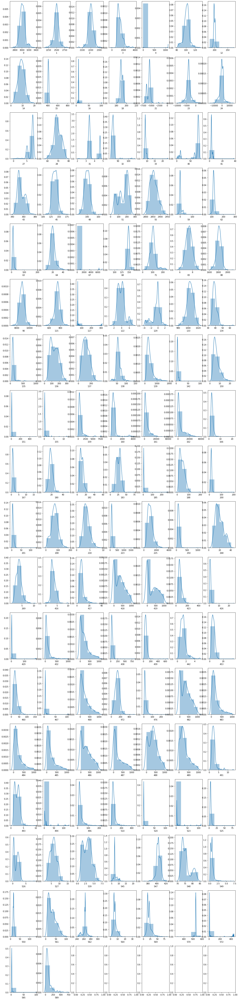

In [20]:
#A. Perform a detailed univariate Analysis with appropriate detailed comments after each analysis.
fig,axes=plt.subplots(18,7,figsize=(20,90))
i=0
for c in Signaldf.columns[:-1]:     # finding the axes and plotting distribution
    ax = axes[i // 7, i % 7]
    sns.distplot(Signaldf[c],bins=5,ax=ax);
    i=i+1

### Insights

Normally distributed Features :	Feature 0,1,2,6,14,23,90,115.

Features with median less than mean that is  left skew in data : 3,12,15,16,32,33,63,117,132,145,151,155,159,160,161,162,167,182,185,200,201,250,223,426,429,432,438,439,467,476,520,525,572 

Feature with median greater than mean that is  Right skew in data : 27,570 

Features where Majority of data falls in one bin others are outliers: 4,15,16,32,33,63,67,135,142,151,155,167,185,200,201,223,250,429,438,439,467,420,523,550,572,585 

Feature 4 - 75th percentile is 1.5 and max is in 1114. hence, there is a outlier.

Feature 24 normally distributed with some dip in the middle

### Box plot of data with outliers

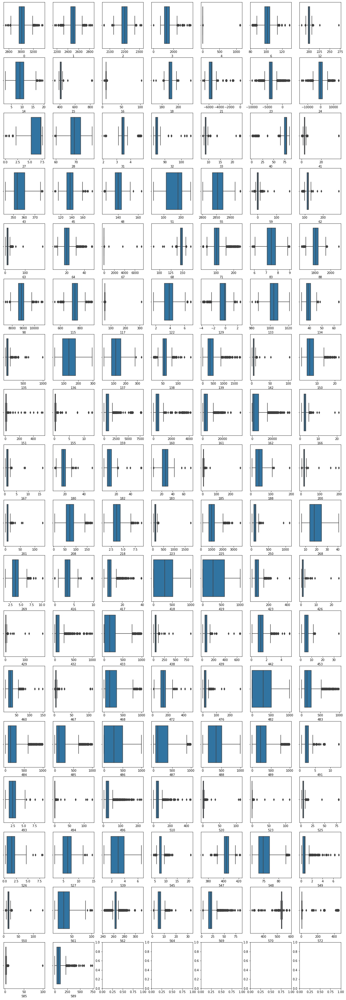

In [21]:

fig,axes=plt.subplots(18,7,figsize=(20,60))
i=0
for c in Signaldf.columns[:-1]:
    ax = axes[i // 7, i % 7]
    sns.boxplot(Signaldf[c],ax=ax);
    i=i+1




## Insights


Feature without Outliers: 51,136,418,419,482,486,488,539

Upper Fence outliers : 14,32,43,67,117,122,134,135,137,139,142,150,151,155,159,160,161,162,166,167,182,183,185,188,201,208,218,223,225,250,269,417,423,426,429,432,433,438,439,442,453,460,467,468,472,4476,483,484,485,487,489,491,493,494,496,510,520,523,525,526,527,545,547,548,549,561,572,585

Lower Fence Outliers:27,28,40,133

Both upper fence and lower fence outliers: 0,1,2,3,6,12,15,16,18,21,23,24,33,41,45,6,71,83,88,90,115,129,138,180,200,416,550,562,564,569,570


Belw box plot is plotted after imputing outliers with lower whisker and upper whisker accordingly.

### Box plot of data without outliers

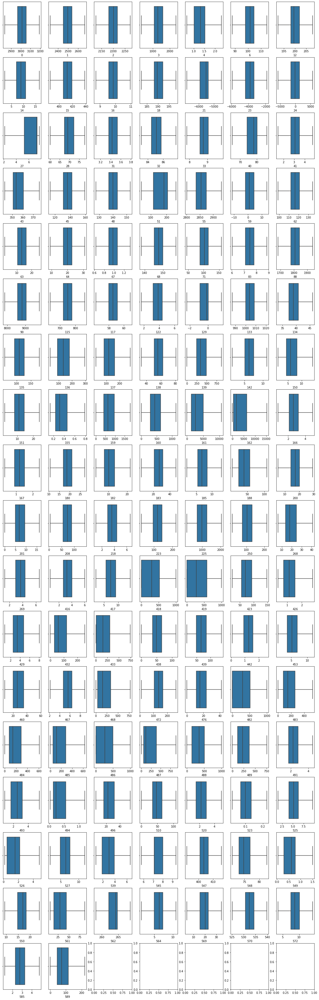

In [22]:
fig,axes=plt.subplots(18,7,figsize=(20,65))
i=0
for c in Signaldf2.columns[:-1]:     #for every categorical calumn , finding the axes and plotting distribution
    ax = axes[i // 7, i % 7]
    sns.boxplot(Signaldf2[c],ax=ax);
    i=i+1




## Insights

Outliers are handled


Normally distributed Features :	Feature 0,1,2,6,14,23,90,115.

Left Skew: 3,12,15,16,32,33,63,117,132,145,151,155,159,160,161,162,167,182,185,200,201,250,223,426,429,432,438,439,467,476,520,525,572 

Right Skew: 27,570 


In [23]:
#B. Perform bivariate and multivariate analysis with appropriate detailed comments after each analysis.

## Bivariate Analysis

Target data analysis

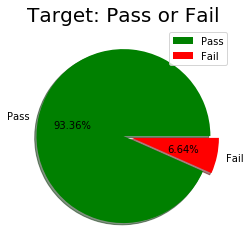

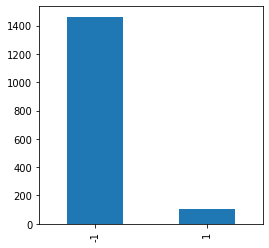

In [24]:
labels = ['Pass', 'Fail']
size = Signaldf['Pass/Fail'].value_counts()
colors = ['green', 'red']
explode = [0, 0.1]

#plt.style.use('seaborn-deep')
plt.rcParams['figure.figsize'] = (4, 4)
plt.pie(size, labels =labels, colors = colors, explode = explode, autopct = "%.2f%%", shadow = True)
plt.axis('off')
plt.title('Target: Pass or Fail', fontsize = 20)
plt.legend()
plt.show()
Signaldf['Pass/Fail'].value_counts().plot(kind="bar");


## Insights

It is observed that target value are imbalanced they have to be balanced with SMOTE

target pass is 93.36% where as Target fail is 6.64% only

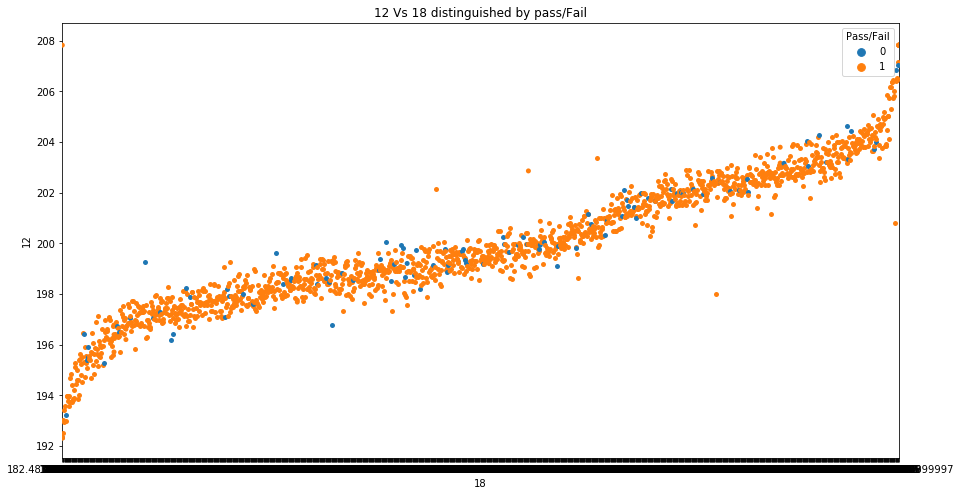

In [25]:
plt.figure(figsize=(15,8))
ax=sns.stripplot(y="12", x="18", hue='Pass/Fail' ,data=Signaldf2)
plt. title("12 Vs 18 distinguished by pass/Fail")
plt.show()

## Insights

feature 12 and 18 is positively correlated and pass and fail are distributed across the data

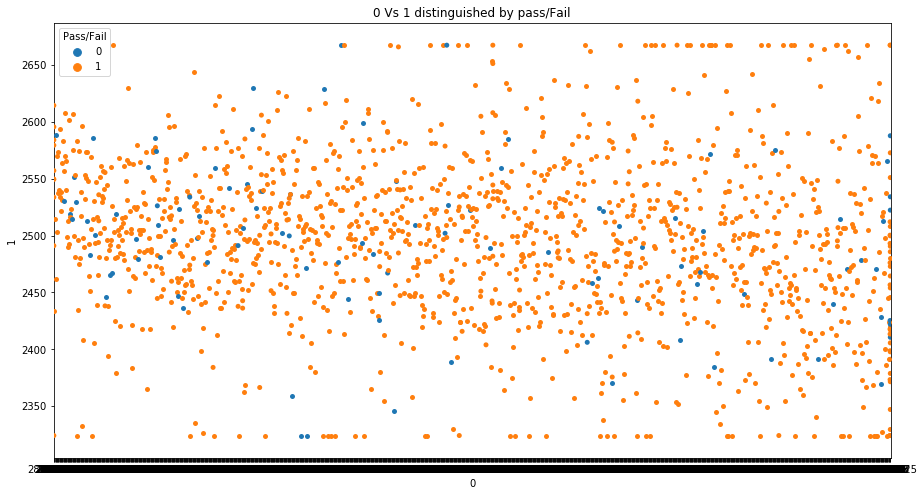

In [26]:
plt.figure(figsize=(15,8))
sns.swarmplot(x="0", y="1", hue='Pass/Fail' , data=Signaldf2)
plt. title("0 Vs 1 distinguished by pass/Fail")
plt.show()

There seems to no correlation between the two feature which are near[0,1] to each other

## Multivariate Analysis

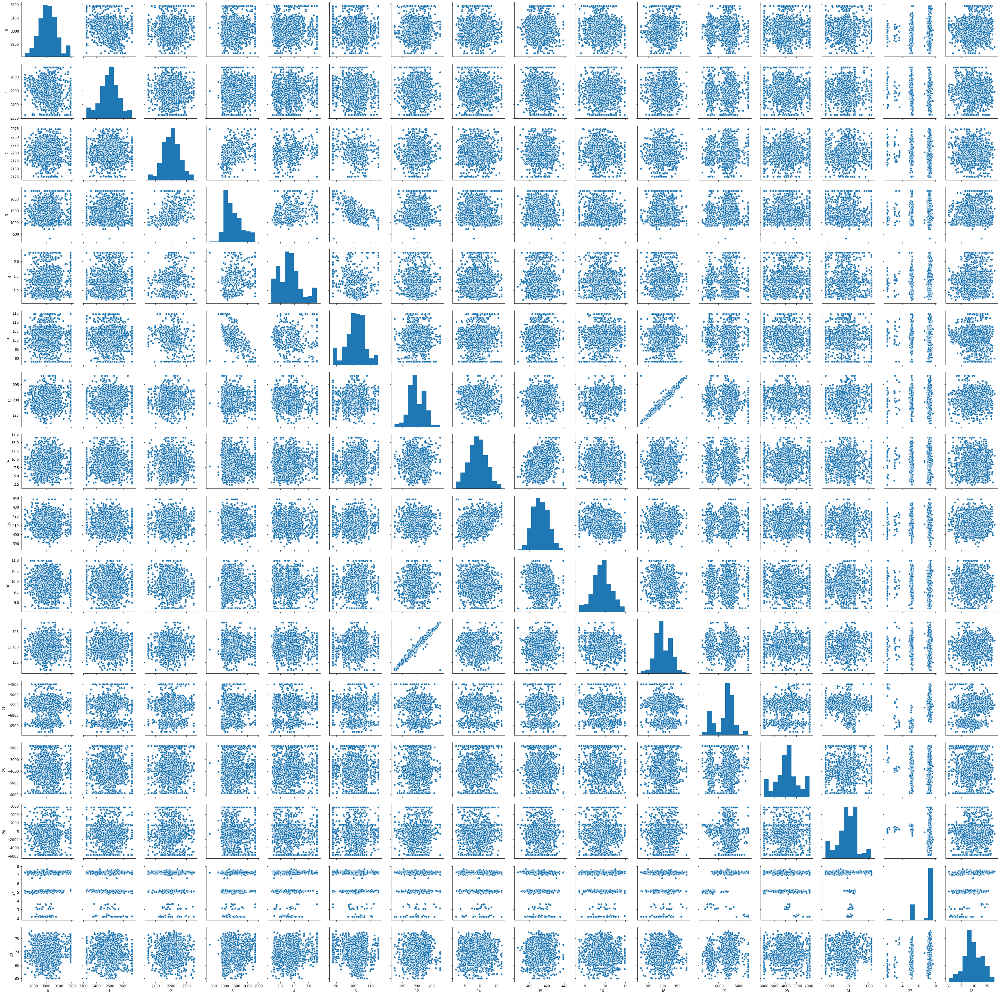

In [27]:

sns.pairplot(Signaldf2.iloc[:,0:16]);

## Insights (first 15 features)
Since multicolinearity data was removed with threshold of 7.5 ; Most of the data are less correlated.
there are only few positive corelation observerd in data [ featre 12 and 18 are positively correlated ]

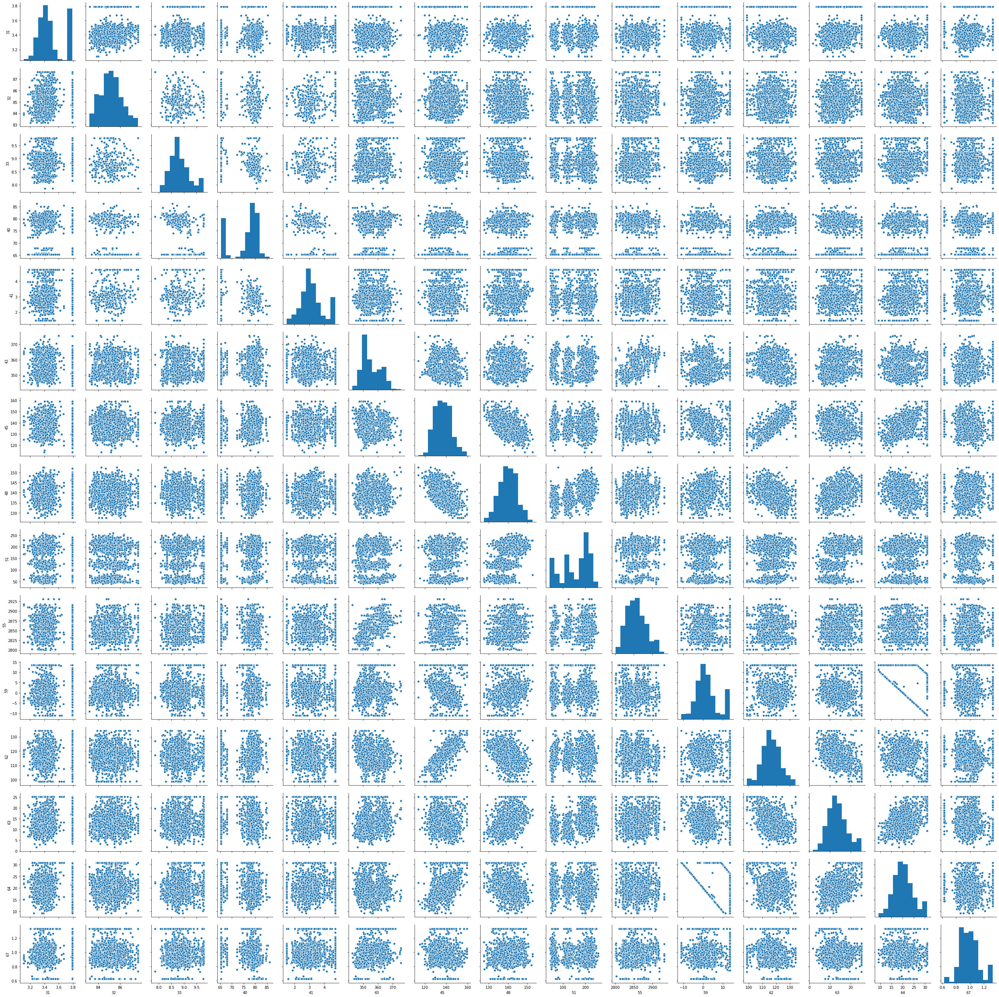

In [28]:
sns.pairplot(Signaldf2.iloc[:,16:31]);

## Insights (16 to 30 features)

Since multiclinearity data was removed with threshold of 7.5 ; Most of the data are less correlated.
there are only few positive corelation observerd in data [ featre 45 and 62 are positively correlated ]

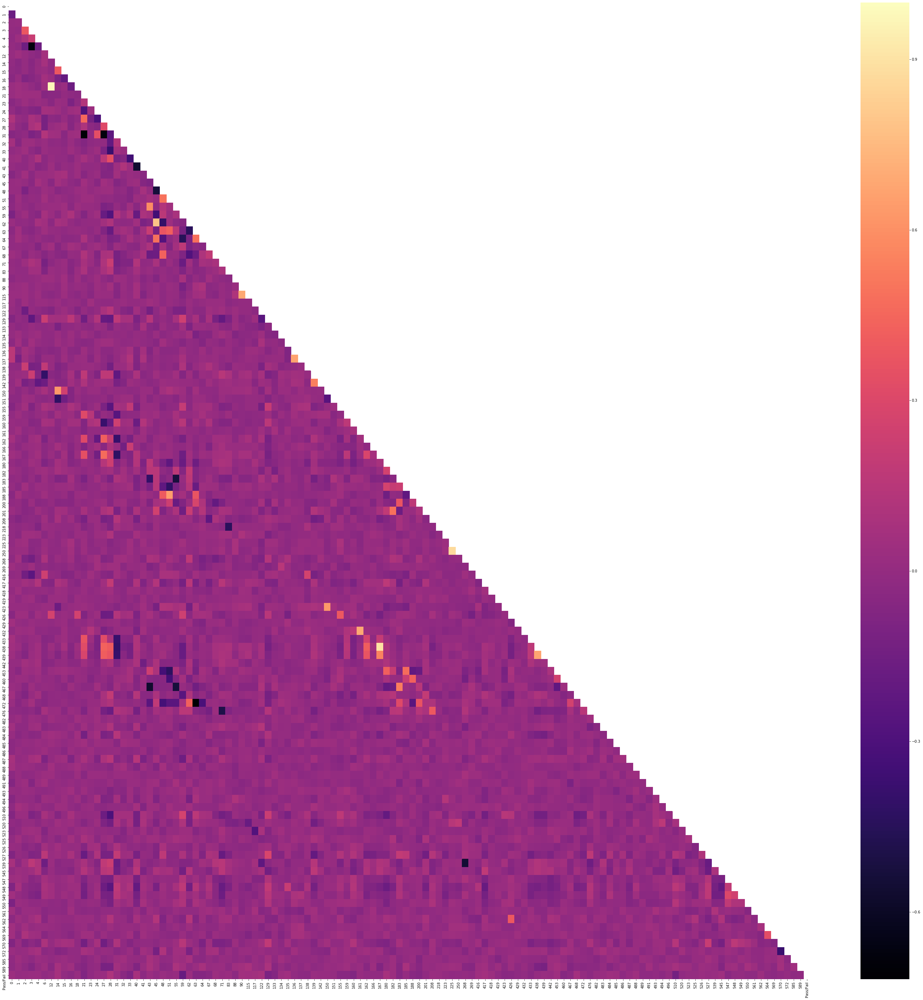

In [29]:
mask = np.triu(np.ones_like(Signaldf2.corr()))
plt.figure(figsize=(50,50))
sns.heatmap(Signaldf2.corr(),mask=mask,cmap="magma");

## Insights


From the colour patttern , it is observed that very less features are correalted 

Reason : multicolinearity data was removed with threshold of 7.5

### 4. Data pre-processing:

In [29]:
#A. Segregate predictors vs target attributes.
x=Signaldf2.drop("Pass/Fail" , axis=1)
y =Signaldf2["Pass/Fail"]

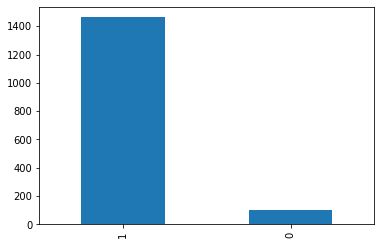


------ Balancing the data with SMOTE ------

Before Sampling
 [[   0  104]
 [   1 1463]]
After Sampling
 [[   0 1463]
 [   1 1463]]


In [30]:
#B. Check for target balancing and fix it if found imbalanced

Signaldf2['Pass/Fail'].value_counts().plot(kind="bar");
plt.show()
def balancingtarget(X,Y):
        print("\n------ Balancing the data with SMOTE ------\n")
        sm = SMOTE(random_state = 40, sampling_strategy='all')
        X_res, Y_res = sm.fit_resample(X, Y)

        # Before oversampling
        unique, counts = np.unique(Y, return_counts = True)
        print("Before Sampling\n",np.asarray((unique, counts)).T)

        # After oversampling
        unique, counts = np.unique(Y_res, return_counts = True)
        print("After Sampling\n",np.asarray((unique, counts)).T)
        return X_res,Y_res
X_res,Y_res=balancingtarget(x,y)

### C. Perform train-test split and standardise the data or vice versa if required


Before data standardization train and test data needs to be splitted . Or else <b>data leak</b> may happen

In [31]:

def Train_test_split(x,y):
        print("\n------ Train test split ------\n")
        X_train, X_test, Y_train, Y_test = train_test_split(x, y, test_size=0.20, random_state=12)
        return X_train, X_test, Y_train, Y_test
    
X_train, X_test, Y_train, Y_test=Train_test_split(X_res, Y_res)
print("Xtrain shape :",X_train.shape)
print("Xtest shape :",X_test.shape)
print("Ytrain shape :",Y_train.shape)
print("Ytest shape :",Y_test.shape)


------ Train test split ------

Xtrain shape : (2340, 121)
Xtest shape : (586, 121)
Ytrain shape : (2340,)
Ytest shape : (586,)


In [32]:
#Standardization

from scipy.stats import zscore
from sklearn.preprocessing import StandardScaler

def standardize(X_train, X_test, Y_train, Y_test): 
    scaler = StandardScaler()
    X_train_std = scaler.fit_transform(X_train)
    X_test_std = scaler.transform(X_test)
    
    #X_train_std=X_train.apply(zscore)
    #X_test_std=X_test.apply(zscore)
    
    Y_train_std = Y_train.values
    Y_test_std= Y_test.values
    return X_train_std, X_test_std, Y_train_std, Y_test_std


X_train_std, X_test_std, Y_train_std, Y_test_std=standardize(X_train, X_test, Y_train, Y_test)

In [33]:
#D. Check if the train and test data have similar statistical characteristics when compared with original data. 
X_train.describe()

,0,1,2,3,4,6,12,14,15,16,...,549,550,561,562,564,569,570,572,585,589
count,2340.000000,2340.000000,2340.000000,2340.000000,2340.000000,2340.000000,2340.000000,2340.000000,2340.000000,2340.000000,...,2340.000000,2340.000000,2340.000000,2340.000000,2340.000000,2340.000000,2340.000000,2340.000000,2340.000000,2340.000000
mean,3007.842648,2496.336659,2199.827437,1363.870328,1.315968,101.236714,199.933362,8.672817,412.769811,9.879165,...,0.594690,16.956632,32.920500,263.197685,6.442950,21.015874,532.452927,8.881544,2.890630,89.365368
std,68.750176,65.137546,25.365749,334.367537,0.337618,4.866365,2.314128,2.542275,7.544081,0.426611,...,0.327942,2.663737,17.647796,2.943308,1.971279,6.420773,2.701117,1.890937,0.726817,55.520390
min,2831.852500,2324.095000,2125.666625,324.459650,0.681500,88.049500,192.317250,2.249300,386.703300,8.729750,...,0.044600,9.442500,7.236900,258.153000,1.485000,4.112700,525.222150,3.555000,1.284500,0.000000
25%,2959.824264,2457.465000,2181.611100,1108.224600,1.080323,98.692756,198.394025,6.873486,407.520025,9.607824,...,0.351508,15.164397,17.583040,261.488399,4.980000,15.466200,530.980900,7.600000,2.330635,48.907200
50%,2999.925000,2499.836044,2198.820315,1287.965884,1.306157,101.462239,199.707639,8.721650,412.413318,9.876245,...,0.566282,17.005355,30.369767,263.257000,6.412965,21.117700,532.435500,8.726864,2.784273,73.865700
75%,3050.416392,2534.225400,2215.511100,1563.740629,1.486900,104.056236,201.749891,10.344418,417.882739,10.136200,...,0.729662,18.475000,44.384500,264.577632,7.482634,24.673800,534.178699,9.980000,3.315975,114.749700
max,3191.352500,2667.535000,2273.488825,2349.596050,2.297450,114.418300,207.820450,16.501625,438.510500,10.966550,...,1.499100,23.782500,86.633150,268.681000,10.805000,34.388700,539.836950,14.075000,4.777625,220.321350


In [35]:
X_test.describe()

,0,1,2,3,4,6,12,14,15,16,...,549,550,561,562,564,569,570,572,585,589
count,586.000000,586.000000,586.000000,586.000000,586.000000,586.000000,586.000000,586.000000,586.000000,586.000000,...,586.000000,586.000000,586.000000,586.000000,586.000000,586.000000,586.000000,586.000000,586.000000,586.000000
mean,3007.794982,2495.727437,2200.937496,1369.517053,1.326057,101.267121,199.918776,8.807135,412.894199,9.894630,...,0.620041,16.932862,32.188992,263.279283,6.394217,20.581620,532.478569,8.915850,2.950852,91.051415
std,70.287301,65.637569,25.419005,348.094117,0.332875,5.121758,2.376551,2.503772,7.441295,0.424505,...,0.339631,2.563499,17.349672,2.928178,1.887331,6.242947,2.732351,1.789840,0.759528,54.913684
min,2831.852500,2324.095000,2125.666625,711.025800,0.681500,88.049500,192.317250,2.293500,390.836700,8.729750,...,0.089800,9.442500,7.375500,258.153000,1.690000,4.112700,525.222150,4.920000,1.197500,0.000000
25%,2962.335619,2454.549299,2182.835643,1093.649325,1.078706,98.423264,198.359231,7.019927,407.854154,9.636810,...,0.368763,15.141396,17.084172,261.860887,4.980000,15.466200,531.005536,7.747469,2.371694,49.029554
50%,2998.172992,2502.265000,2200.205550,1303.099650,1.317250,101.460000,199.782092,8.840235,412.400641,9.905754,...,0.604330,17.010513,29.280690,263.386507,6.235453,20.957678,532.449550,8.722824,2.868800,76.142506
75%,3048.156455,2538.360000,2217.206591,1553.130789,1.512300,104.134081,201.678992,10.472149,418.019391,10.164127,...,0.751058,18.447500,42.763652,264.465911,7.216783,23.103101,534.326400,9.932959,3.436879,122.531850
max,3191.352500,2667.535000,2273.488825,2349.596050,2.297450,114.418300,207.820450,16.501625,438.510500,10.966550,...,1.499100,23.782500,86.633150,268.681000,10.805000,34.388700,539.836950,14.075000,4.777625,220.321350


In [28]:
Signaldf2.describe()

,0,1,2,3,4,6,12,14,15,16,...,550,561,562,564,569,570,572,585,589,Pass/Fail
count,1567.000000,1567.000000,1567.000000,1567.000000,1567.000000,1567.000000,1567.000000,1567.000000,1567.000000,1567.000000,...,1567.000000,1567.000000,1567.000000,1567.000000,1567.000000,1567.000000,1567.000000,1567.000000,1567.000000,1567.000000
mean,3013.550718,2495.827151,2200.738093,1378.987211,1.335295,101.126052,199.909005,8.996414,412.572770,9.853184,...,16.893188,32.231019,263.375652,6.335137,20.294693,532.403523,8.920264,2.879622,89.098896,0.933631
std,69.717994,72.031718,27.718592,378.657045,0.386295,5.593793,2.574512,2.766665,8.630644,0.443025,...,2.853055,18.850176,3.254602,2.038328,6.713356,3.050515,2.084039,0.771946,60.462630,0.249005
min,2831.852500,2324.095000,2125.666625,324.459650,0.681500,88.049500,192.317250,2.249300,386.703300,8.729750,...,9.442500,7.236900,258.153000,1.485000,4.112700,525.222150,3.555000,1.197500,0.000000,0.000000
25%,2966.665000,2452.885000,2181.099950,1083.885800,1.017700,97.937800,198.130950,7.096750,406.131000,9.568550,...,14.820000,15.766900,262.101000,4.980000,15.466200,530.702700,7.500000,2.306500,44.368600,1.000000
50%,3011.840000,2498.910000,2200.955600,1287.353800,1.317100,101.492200,199.537100,8.973900,412.262900,9.852000,...,17.013300,29.780100,264.272000,6.290000,20.182400,532.398200,8.650000,2.757700,72.023000,1.000000
75%,3056.540000,2538.745000,2218.055500,1590.169900,1.529600,104.530000,202.006750,10.858700,419.082800,10.127750,...,18.405000,44.113400,264.733000,7.310000,23.035200,534.356400,10.130000,3.294950,114.749700,1.000000
max,3191.352500,2667.535000,2273.488825,2349.596050,2.297450,114.418300,207.820450,16.501625,438.510500,10.966550,...,23.782500,86.633150,268.681000,10.805000,34.388700,539.836950,14.075000,4.777625,220.321350,1.000000


Mean , median and mode of all the original, train and test data are in th same range.
Still I'll do hypothesis testing to prove

let my H0 = Mean of train and test data are same 
Ha= Mean of train and test data are not same



Ztest to identify the statisitical similarities

In [42]:
from statsmodels.stats import weightstats as stests

ztest,pval=stests.ztest(X_test['0'],x2=X_train['0'],value=0,alternative='two-sided')
print("Pvalue of original and Train data",pval)
if(pval<0.05):
    print("Reject Null Hypothesis, Mean of test and train data for feature 0 is not same")
else:
    print("Fail to reject Null Hypothesis , Mean of test and train data for feature 0 is same")


Pvalue of original and Train data 0.9880788084278067
Fail to reject Null Hypothesis , Mean of test and train data for feature 0 is same


In [46]:
#ANOVA


#let my H0 = Mean of original, train and test data are same 
#Ha= Mean of original, train and test data are not same


from scipy.stats import f_oneway
ztest,pval=f_oneway(Signaldf2['2'], X_train['2'], X_test['2'])
print("feature 0, Pvalue" ,pval)
if(pval<0.05):
    print("Reject Null Hypothesis, Mean of original, test and train data for feature 2 is not same")
else:
    print("Fail to reject Null Hypothesis , Mean of original,test and train data for feature 2 is same")

feature 0, Pvalue 0.462234841333687
Fail to reject Null Hypothesis , Mean of original,test and train data for feature 2 is same


From Ztest and anova, its observerd that selected random feature  have similar characteristics in original, test and train split.

### 5. Model training, testing and tuning: 

Training score 1.0
Test Score 0.9948805460750854

              precision    recall  f1-score   support

           0       0.99      1.00      0.99       293
           1       1.00      0.99      0.99       293

    accuracy                           0.99       586
   macro avg       0.99      0.99      0.99       586
weighted avg       0.99      0.99      0.99       586


Confusion Matrix:
 [[293   0]
 [  3 290]]


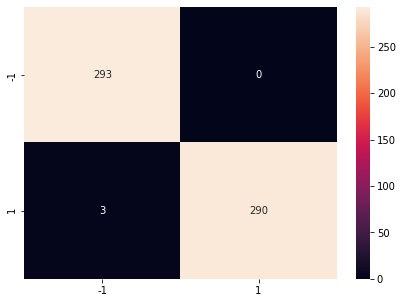


Accuracy Score:
 0.995


In [36]:
#A. Use any Supervised Learning technique to train a model.

from sklearn.ensemble import RandomForestClassifier
rfc = RandomForestClassifier(n_estimators = 100, random_state=10)
rfc = rfc.fit(X_train_std, Y_train_std)
y_predict = rfc.predict(X_test_std)

print("Training score",rfc.score(X_train_std , Y_train_std))
print("Test Score",rfc.score(X_test_std , Y_test_std))

# Classification Report
print('\n{}'.format(classification_report(Y_test_std, y_predict)))

# Confusion Matrix
cm = confusion_matrix(Y_test_std, y_predict)
print('\nConfusion Matrix:\n', cm)

df_cm = pd.DataFrame(cm, index = [i for i in [-1,1]],columns = [i for i in [-1,1]])
plt.figure(figsize = (7,5))
sns.heatmap(df_cm, annot=True ,fmt='g')
plt.show()

# Accuracy Score
auc = accuracy_score(Y_test_std, y_predict)
print('\nAccuracy Score:\n', auc.round(3))

In [37]:
#B. Use cross validation techniques. Hint: Use all CV techniques 

#CROSS VALIDATION WITH K FOLD
from sklearn.model_selection import KFold, cross_val_score
num_folds = 10
seed = 7

kfold = KFold(n_splits=num_folds)
results = cross_val_score(rfc, x, y, cv=kfold)
print(results)
print("Accuracy: %.3f%% (%.3f%%)" % (results.mean()*100.0, results.std()*100.0))

[0.87261146 0.84713376 0.91082803 0.95541401 0.98726115 0.94267516
 0.98726115 0.93589744 0.91666667 0.98076923]
Accuracy: 93.365% (4.533%)


In [38]:
#startified k fold
num_folds = 10
stratifiedkfold = StratifiedKFold(n_splits=num_folds)
results = cross_val_score(rfc, x, y, cv=stratifiedkfold)
print(results)
print("Accuracy: %.3f%% (%.3f%%)" % (results.mean()*100.0, results.std()*100.0))

[0.91082803 0.93630573 0.93630573 0.92993631 0.92993631 0.92993631
 0.92993631 0.93589744 0.93589744 0.93589744]
Accuracy: 93.109% (0.735%)


In [40]:
#LOOCV TECHNIQUE
from sklearn.model_selection import LeaveOneOut, cross_val_score

scores = cross_val_score(rfc,x,y, cv=LeaveOneOut())
print(scores.mean())
print(scores.std())

0.9336311423101468
0.2489257568408646


In [112]:
#Bootstrapping 
result=[]
from sklearn.utils import resample

for k in range(10):
    x1,y1=resample(X_train,Y_train)
    rfc.fit(x1,y1)
    y_pred=rfc.predict(X_test)
    result.append(accuracy_score(y_pred,Y_test))
print(np.array(result).mean())
print(np.array(result).std())

0.9781569965870307
0.004992743630828598


| Cross validation technique | Accuracy | Standard Deviation | 
| --- | --- | --- |
| K- Fold  | 93.3% | 4.5% |
|Stratified K- Fold |93.1% |0.735|
|LOOCV|93.3%|0.24|
|Bootstrapping |97%|0.004%|


All the cross validation technique gives good result 93-97% accuracy ; but deviation in scores are high in K-fold and LOOCV.

Bootstrapping and stratified k - Fold have less deviation . Bootsetstraping yields good result with 97% accuracy and very less deviation

In [42]:
#C. Apply hyper-parameter tuning techniques to get the best accuracy. Suggestion: Use all possible hyper parameter combinations to extract the best accuracies. 

##HYPER PARAMETER TUNING WITH RANDOM SEARCH CROSS VALIDATION
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RandomizedSearchCV
from sklearn.ensemble import RandomForestClassifier
from scipy.stats import randint as sp_randint
clf = RandomForestClassifier(n_estimators=50)
param_dist = {"max_depth": [3, None],
              "max_features": sp_randint(2, 11),
              "min_samples_split": sp_randint(2, 11),
              "min_samples_leaf": sp_randint(2, 11),
              "bootstrap": [True, False],
              "criterion": ["gini", "entropy"]}
samples = 10  # number of random samples 
randomCV = RandomizedSearchCV(clf, param_distributions=param_dist, n_iter=samples) #default cv = 3
randomCV.fit(X_train_std, Y_train_std)
print("Best Params",randomCV.best_params_)
rfbest = randomCV.best_estimator_
print("Best estimators",rfbest)
print("Best train score",rfbest.score(X_train_std,Y_train_std))
print("Best test score",rfbest.score(X_test_std,Y_test_std))

Best Params {'bootstrap': False, 'criterion': 'entropy', 'max_depth': None, 'max_features': 8, 'min_samples_leaf': 6, 'min_samples_split': 2}
Best estimators RandomForestClassifier(bootstrap=False, criterion='entropy', max_features=8,
                       min_samples_leaf=6, n_estimators=50)
Best train score 1.0
Best test score 0.9829351535836177


In [43]:
##HYPER PARAMETER TUNING WITH GRID SEARCH CROSS VALIDATION
param_grid = {"max_depth": [3, None],
              "max_features": [2, 3, 10],
              "min_samples_split": [2, 3, 10],
              "min_samples_leaf": [2, 3, 10],
              "bootstrap": [True, False],
              "criterion": ["gini", "entropy"]}
grid_search = GridSearchCV(clf, param_grid=param_grid)
grid_search.fit(X_train_std, Y_train_std)
print("Best Params",grid_search.best_params_)
RfGsbest=grid_search.best_estimator_
print("Best estimators",RfGsbest)
print("Best train score",RfGsbest.score(X_train_std,Y_train_std))
print("Best test score",RfGsbest.score(X_test_std,Y_test_std))

Best Params {'bootstrap': False, 'criterion': 'gini', 'max_depth': None, 'max_features': 2, 'min_samples_leaf': 2, 'min_samples_split': 3}
Best estimators RandomForestClassifier(bootstrap=False, max_features=2, min_samples_leaf=2,
                       min_samples_split=3, n_estimators=50)
Best train score 1.0
Best test score 0.9948805460750854


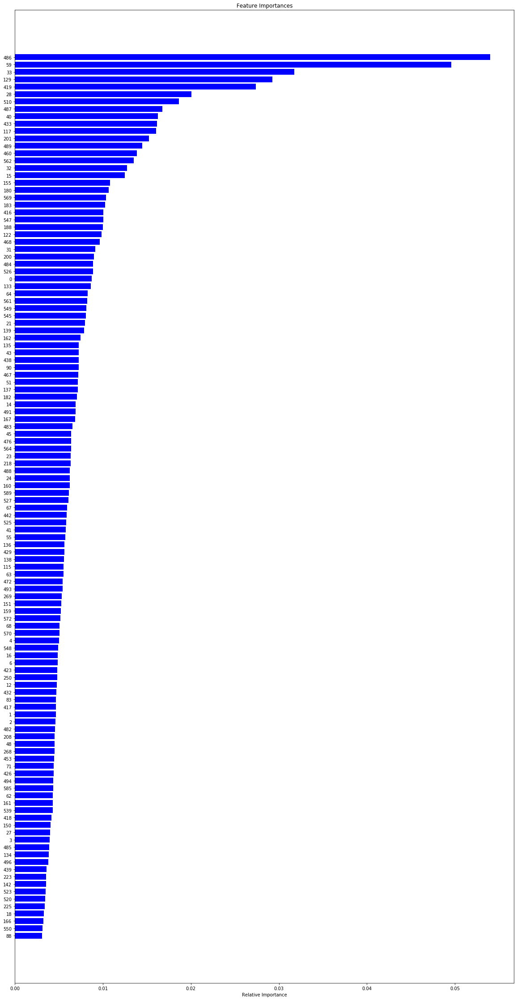

In [44]:
#D. Use any other technique/method which can enhance the model performance.Hint: Dimensionality reduction, attribute removal, standardisation/normalisation, target balancing etc.


#IDENTIFY FEATURE IMPORTANCE
features = Signaldf2.columns
importances = rfc.feature_importances_
plt.figure(figsize=(20,40))
indices = np.argsort(importances)[-120:]
plt.title('Feature Importances')

plt.barh(range(len(indices)), importances[indices], color='b', align='center')
plt.yticks(range(len(indices)), [features[i] for i in indices])
plt.xlabel('Relative Importance')
plt.show()

<b>Standaridization /Normalization :</b>
    Already done in above step

<b>Target Imbalance:</b>
    Already done in above steps
    
<b>Attribute Removal and some dimensinality are reduced already </b>
    
    1.Low variance filter
    2. High Correlated feature
    3. Zero variance Filter
    4. Missing Values abve 20% were filtered

### DIMENSIONALITY REDUCTION WITH PCA

In [45]:
pca = PCA()
pca.fit(X_train_std)
X_train_reduced = pca.fit_transform(X_train_std)
X_test_reduced = pca.fit_transform(X_test_std)
display(X_train_reduced.shape, X_test_reduced.shape)

(2340, 121)

(586, 121)

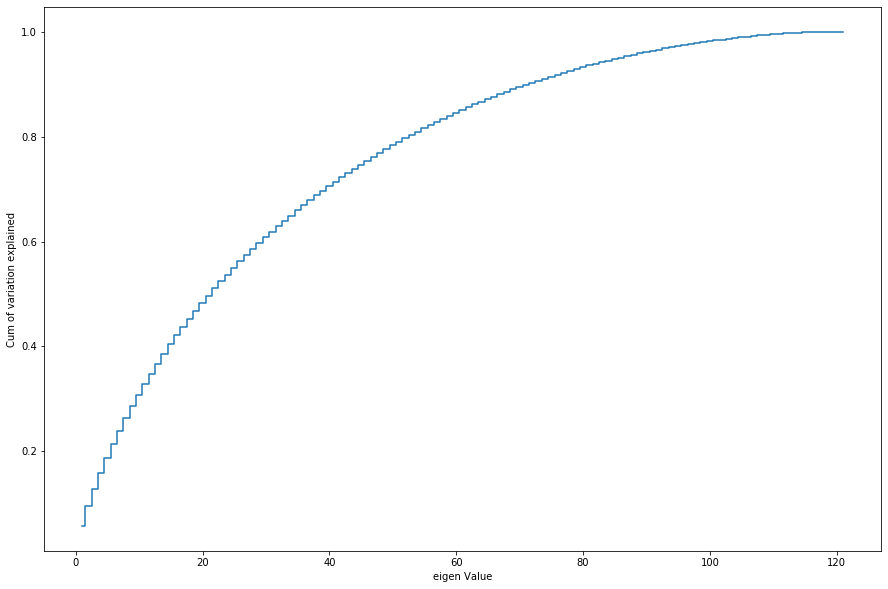

In [46]:
plt.figure(figsize=(15,10));
plt.step(list(range(1,122)),np.cumsum(pca.explained_variance_ratio_), where='mid')

plt.ylabel('Cum of variation explained')
plt.xlabel('eigen Value')
plt.show()

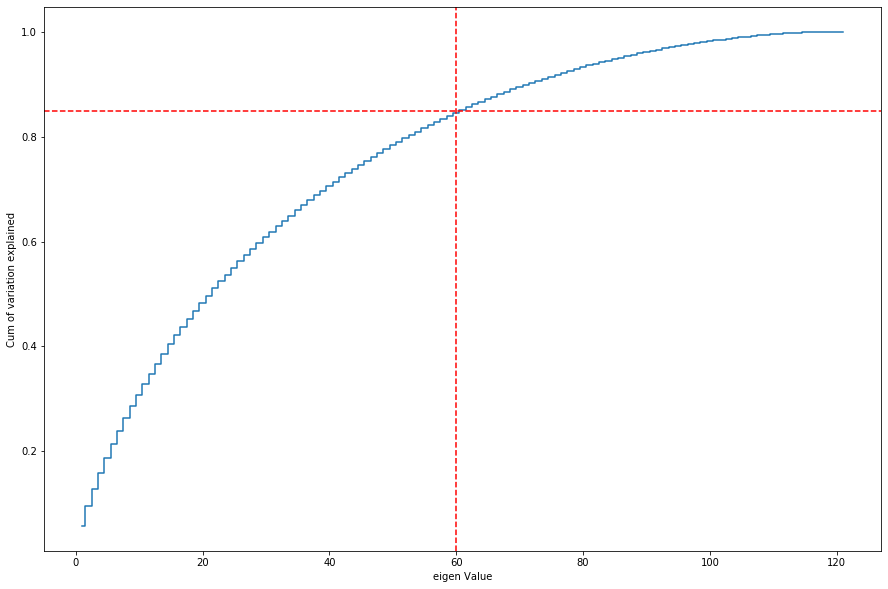

In [47]:
plt.figure(figsize=(15,10));
plt.step(list(range(1,122)),np.cumsum(pca.explained_variance_ratio_), where='mid')
plt.ylabel('Cum of variation explained')
plt.xlabel('eigen Value')
plt.axhline(y = 0.85, color = 'r', linestyle = '--')
plt.axvline(x = 60, color = 'r', linestyle = '--')
plt.show()

In [48]:
pca = PCA(n_components =60 , random_state = 14)
pca.fit(X_train_std)
X_train_reduced = pca.fit_transform(X_train_std)
X_test_reduced = pca.fit_transform(X_test_std)
display(X_train_reduced.shape, X_test_reduced.shape)

(2340, 60)

(586, 60)

In [49]:
#cross validation after PCA dimensinality reduction to 60 components
param_grid = {'max_depth':[3,5,7,9,11],
              'min_samples_leaf':[2,4,5],
              'min_samples_split':[2,3,5,6]}
grid = GridSearchCV(clf, param_grid,cv=3,verbose = 3)
grid.fit(X_train_reduced, Y_train_std)
print(grid.best_params_)
pcabest = grid.best_estimator_
y_predict_Grid = pcabest.predict(X_test_reduced)
print("Best estimators",pcabest)
print("Best train score",pcabest.score(X_train_reduced,Y_train_std))
print("Best test score",pcabest.score(X_test_reduced,Y_test_std))

Fitting 3 folds for each of 60 candidates, totalling 180 fits
[CV 1/3] END max_depth=3, min_samples_leaf=2, min_samples_split=2;, score=0.847 total time=   0.2s
[CV 2/3] END max_depth=3, min_samples_leaf=2, min_samples_split=2;, score=0.842 total time=   0.1s
[CV 3/3] END max_depth=3, min_samples_leaf=2, min_samples_split=2;, score=0.851 total time=   0.1s
[CV 1/3] END max_depth=3, min_samples_leaf=2, min_samples_split=3;, score=0.868 total time=   0.2s
[CV 2/3] END max_depth=3, min_samples_leaf=2, min_samples_split=3;, score=0.817 total time=   0.2s
[CV 3/3] END max_depth=3, min_samples_leaf=2, min_samples_split=3;, score=0.862 total time=   0.2s
[CV 1/3] END max_depth=3, min_samples_leaf=2, min_samples_split=5;, score=0.883 total time=   0.2s
[CV 2/3] END max_depth=3, min_samples_leaf=2, min_samples_split=5;, score=0.844 total time=   0.2s
[CV 3/3] END max_depth=3, min_samples_leaf=2, min_samples_split=5;, score=0.838 total time=   0.2s
[CV 1/3] END max_depth=3, min_samples_leaf=2, m

[CV 3/3] END max_depth=7, min_samples_leaf=2, min_samples_split=6;, score=0.921 total time=   0.3s
[CV 1/3] END max_depth=7, min_samples_leaf=4, min_samples_split=2;, score=0.950 total time=   0.4s
[CV 2/3] END max_depth=7, min_samples_leaf=4, min_samples_split=2;, score=0.914 total time=   0.5s
[CV 3/3] END max_depth=7, min_samples_leaf=4, min_samples_split=2;, score=0.914 total time=   0.4s
[CV 1/3] END max_depth=7, min_samples_leaf=4, min_samples_split=3;, score=0.942 total time=   0.3s
[CV 2/3] END max_depth=7, min_samples_leaf=4, min_samples_split=3;, score=0.908 total time=   0.3s
[CV 3/3] END max_depth=7, min_samples_leaf=4, min_samples_split=3;, score=0.924 total time=   0.3s
[CV 1/3] END max_depth=7, min_samples_leaf=4, min_samples_split=5;, score=0.951 total time=   0.3s
[CV 2/3] END max_depth=7, min_samples_leaf=4, min_samples_split=5;, score=0.921 total time=   0.3s
[CV 3/3] END max_depth=7, min_samples_leaf=4, min_samples_split=5;, score=0.932 total time=   0.3s
[CV 1/3] E

[CV 2/3] END max_depth=11, min_samples_leaf=4, min_samples_split=6;, score=0.945 total time=   1.4s
[CV 3/3] END max_depth=11, min_samples_leaf=4, min_samples_split=6;, score=0.942 total time=   1.5s
[CV 1/3] END max_depth=11, min_samples_leaf=5, min_samples_split=2;, score=0.964 total time=   1.9s
[CV 2/3] END max_depth=11, min_samples_leaf=5, min_samples_split=2;, score=0.937 total time=   2.4s
[CV 3/3] END max_depth=11, min_samples_leaf=5, min_samples_split=2;, score=0.949 total time=   1.7s
[CV 1/3] END max_depth=11, min_samples_leaf=5, min_samples_split=3;, score=0.979 total time=   1.7s
[CV 2/3] END max_depth=11, min_samples_leaf=5, min_samples_split=3;, score=0.942 total time=   1.4s
[CV 3/3] END max_depth=11, min_samples_leaf=5, min_samples_split=3;, score=0.932 total time=   1.4s
[CV 1/3] END max_depth=11, min_samples_leaf=5, min_samples_split=5;, score=0.969 total time=   1.4s
[CV 2/3] END max_depth=11, min_samples_leaf=5, min_samples_split=5;, score=0.938 total time=   1.0s


In [50]:
# Parameter tuned - Random forest model with PCA dimensionality reduction
Rf_pca = RandomForestClassifier(max_depth=11, min_samples_leaf=2, n_estimators=50)
Rf_pca.fit(X_train_reduced , Y_train_std)
Y_true, y_pred = Y_test_std, Rf_pca.predict(X_test_reduced) #prediction with test data
Y_traintrue, ytrain_pred = Y_train_std, Rf_pca.predict(X_train_reduced) #prediction with train data
#Training and testing scores
print("Training score: ",Rf_pca.score(X_train_reduced,Y_train_std))
print("Testing score: ",Rf_pca.score(X_test_reduced,Y_true))

Training score:  0.9918803418803419
Testing score:  0.7525597269624573



              precision    recall  f1-score   support

           0       0.87      0.59      0.70       293
           1       0.69      0.91      0.79       293

    accuracy                           0.75       586
   macro avg       0.78      0.75      0.75       586
weighted avg       0.78      0.75      0.75       586


Confusion Matrix:
 [[173 120]
 [ 25 268]]


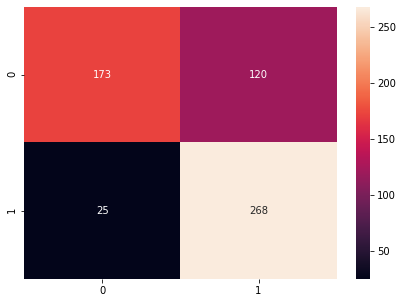


Accuracy Score:
 0.753


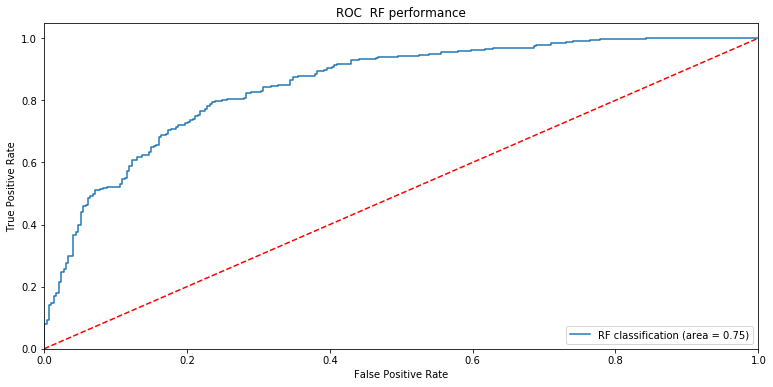

In [51]:
#E. Display and explain the classification report in detail
# Classification Report
print('\n{}'.format(classification_report(Y_true, y_pred)))

# Confusion Matrix
cm = confusion_matrix(Y_true, y_pred)
print('\nConfusion Matrix:\n', cm)

df_cm = pd.DataFrame(cm, index = [i for i in [0,1]],columns = [i for i in [0,1]])
plt.figure(figsize = (7,5))
sns.heatmap(df_cm, annot=True ,fmt='g')
plt.show()


# Accuracy Score
auc = accuracy_score(Y_true, y_pred)
print('\nAccuracy Score:\n', auc.round(3))
RF_roc_auc = roc_auc_score(Y_true, Rf_pca.predict(X_test_reduced))
fpr, tpr, thresholds = roc_curve(Y_true, Rf_pca.predict_proba(X_test_reduced)[:,1])
plt.figure(figsize = (12.8 , 6))
plt.plot(fpr, tpr, label = 'RF classification (area = {})'.\
         format(RF_roc_auc.round(2)))
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC  RF performance')
plt.legend(loc = 'lower right')
plt.show()

<b>Before PCA:  [ with 121 dimension]</b>


Training score 1.0
Test Score 0.9948805460750854

Precision of class 0 [fail] is 99 and recall is 100 

Precision of class 1 [Pass] is 100 and recall is 99 

F1 score of class 0,1 are 99 and 99 respectively


<b>After PCA: [60 dimension ] </b>


we have reduced the dimension into half that is with 60 dimension and reduced the overfit and complexity but there is a dip in test score .


Training score:  0.9918803418803419
Testing score:  0.7525597269624573

Precision of class 0 [fail] is 87 and recall is 64 - high precision

Precision of class 1 [Pass] is 72 and recall is 90 - high recall

F1 score of class 0,1 are 74 and 8 respectively




In [52]:
#F. Apply the above steps for all possible models that you have learnt so far
class BaseModeltraning:
    
        
        
    def GetBasedModel(self):
        print("\n\n------ Defining 8 base Models------\n")
        #making a tuple ist with model name and function
        basedModels = []
        basedModels.append(('LR'   , LogisticRegression()))
        basedModels.append(('KNN'  , KNeighborsClassifier(n_neighbors=3)))
        basedModels.append(('NB'   , GaussianNB()))
        basedModels.append(('SVM'  , SVC(gamma=0.01, C=100)))
        basedModels.append(('CART' , DecisionTreeClassifier(max_depth=11, min_samples_leaf=2)))
        basedModels.append(('AB'   , AdaBoostClassifier(learning_rate=0.3, n_estimators=500)))
        basedModels.append(('GBM'  , GradientBoostingClassifier(learning_rate=0.3, n_estimators=500)))
        basedModels.append(('RF'   , RandomForestClassifier(max_depth=11, min_samples_leaf=2, n_estimators=50)))    
        print(basedModels)
        print("\n\n")
        return basedModels

    def Modelvalidation(self,X_train, Y_train,X_test,Y_test,models,seed):
        print("\n------ Model validation ------\n")
        # Test options and evaluation metric
        num_folds = 10
        scoring = 'accuracy'

        results = []
        names = []
        trainscore=[]
        testscore=[]
        for name, model in models:
            kfold = StratifiedKFold(n_splits=num_folds, random_state=seed,shuffle=True)
            cv_results = cross_val_score(model, X_train, Y_train, cv=kfold, scoring=scoring)
            results.append(cv_results)
            names.append(name)
            
            model.fit(X_train, Y_train)
            Y_true, y_pred = Y_test, model.predict(X_test) #prediction with test data
            Y_traintrue, ytrain_pred = Y_train, model.predict(X_train) #prediction with train data
            #Training and testing scores
            auctest = accuracy_score(Y_true, y_pred)
            testscore.append(auctest.round(2))
            #print('\nTraining Score:\n', auctest.round(3))
            auctrain = accuracy_score(Y_traintrue, ytrain_pred)
            trainscore.append(auctrain.round(2))
            #print('\nTraining Score:\n', auctest.round(3))

            
            
            msg = "%s: CV-%2f ,Train-%2f , Test-%2f" % (name, cv_results.mean(),auctrain,auctest)
            print(msg)

        return names, results,trainscore,testscore



print("\n\n***********Model Building***********\n")
#get the defind models
Basemodel=BaseModeltraning()
bmodels = Basemodel.GetBasedModel()
#get cross validation result of base models
bmnames,bmcvresults,bmtrainscore,bmtestscore = Basemodel.Modelvalidation(X_train_reduced, Y_train_std,X_test_reduced,Y_test_std,bmodels,seed)




***********Model Building***********



------ Defining 8 base Models------

[('LR', LogisticRegression()), ('KNN', KNeighborsClassifier(n_neighbors=3)), ('NB', GaussianNB()), ('SVM', SVC(C=100, gamma=0.01)), ('CART', DecisionTreeClassifier(max_depth=11, min_samples_leaf=2)), ('AB', AdaBoostClassifier(learning_rate=0.3, n_estimators=500)), ('GBM', GradientBoostingClassifier(learning_rate=0.3, n_estimators=500)), ('RF', RandomForestClassifier(max_depth=11, min_samples_leaf=2, n_estimators=50))]




------ Model validation ------

LR: CV-0.779915 ,Train-0.798718 , Test-0.498294
KNN: CV-0.748718 ,Train-0.856410 , Test-0.520478
NB: CV-0.919231 ,Train-0.923932 , Test-0.863481
SVM: CV-0.992735 ,Train-1.000000 , Test-0.561433
CART: CV-0.826496 ,Train-0.918803 , Test-0.730375
AB: CV-0.945726 ,Train-0.999145 , Test-0.795222
GBM: CV-0.975214 ,Train-1.000000 , Test-0.798635
RF: CV-0.969658 ,Train-0.991026 , Test-0.766212


### 6. Post Training and Conclusion:

In [114]:
#A. Display and compare all the models designed with their train and test accuracies.
def scoringtab(modelset,cvresult,bmtrainscore,bmtestscore ):
    print("\n\n------ Base Model Scoring Table ------\n\n")
    scores=[]
    trainscore=[]
    testscore=[]
    models=[]
    names=[]
    for r in cvresult:
        scores.append(round(r.mean()*100,2))

    for name,model in modelset:
        models.append(model)
        names.append(name)
    scoringtab = pd.DataFrame({'Modelname':names,'CV Score': scores,'Train Score': bmtrainscore,'Test Score': bmtestscore})
    return scoringtab
basemodelscore=scoringtab(bmodels,bmcvresults,bmtrainscore,bmtestscore)
basemodelscore



------ Base Model Scoring Table ------




,Modelname,CV Score,Train Score,Test Score
0,LR,77.99,0.80,0.50
1,KNN,74.87,0.86,0.52
2,NB,91.92,0.92,0.86
3,SVM,99.27,1.00,0.56
4,CART,82.65,0.92,0.73
5,AB,94.57,1.00,0.80
6,GBM,97.52,1.00,0.80
7,RF,96.97,0.99,0.77


In [54]:
#B. Select the final best trained model along with your detailed comments for selecting this model.

Overfit Models: Random forest, SVM , ADA-Boosting and Gradient Boosting are Overfit models

Underfit Models: LR, KNN. test accuracies are very less.
    
Among NB and CART , NB seems to be a best mdel cmparing all rss validatin score, train score and test score


Final BEST MODEL : <b> Naive Bayes</b>
    

Training score:  0.923931623931624
Testing score:  0.863481228668942

              precision    recall  f1-score   support

           0       0.90      0.81      0.86       293
           1       0.83      0.91      0.87       293

    accuracy                           0.86       586
   macro avg       0.87      0.86      0.86       586
weighted avg       0.87      0.86      0.86       586


Confusion Matrix:
 [[238  55]
 [ 25 268]]


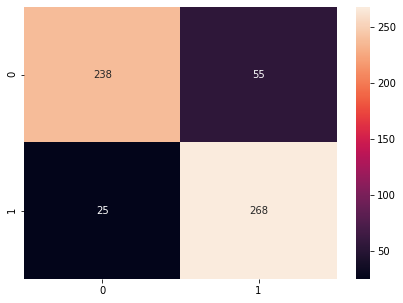


Accuracy Score:
 0.863


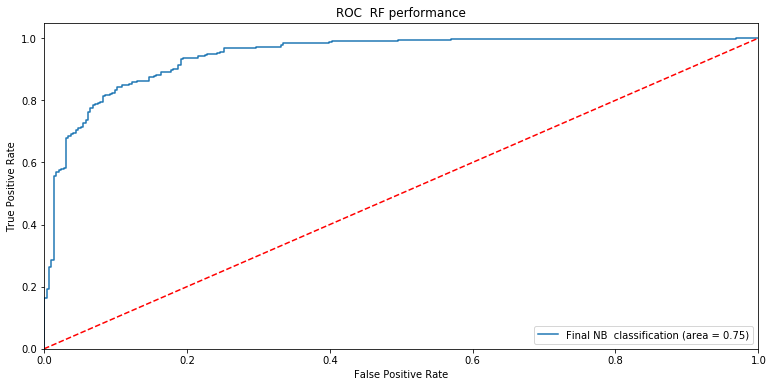

In [55]:

finalmodel=GaussianNB()
finalmodel.fit(X_train_reduced , Y_train_std)
Y_true, y_pred = Y_test_std, finalmodel.predict(X_test_reduced) #prediction with test data
Y_traintrue, ytrain_pred = Y_train_std, finalmodel.predict(X_train_reduced) #prediction with train data
#Training and testing scores
print("Training score: ",finalmodel.score(X_train_reduced,Y_train_std))
print("Testing score: ",finalmodel.score(X_test_reduced,Y_true))
# Classification Report
print('\n{}'.format(classification_report(Y_true, y_pred)))

# Confusion Matrix
cm = confusion_matrix(Y_true, y_pred)
print('\nConfusion Matrix:\n', cm)

df_cm = pd.DataFrame(cm, index = [i for i in [0,1]],columns = [i for i in [0,1]])
plt.figure(figsize = (7,5))
sns.heatmap(df_cm, annot=True ,fmt='g')
plt.show()


# Accuracy Score
auc = accuracy_score(Y_true, y_pred)
print('\nAccuracy Score:\n', auc.round(3))
final_roc_auc = roc_auc_score(Y_true, finalmodel.predict(X_test_reduced))
fpr, tpr, thresholds = roc_curve(Y_true, finalmodel.predict_proba(X_test_reduced)[:,1])
plt.figure(figsize = (12.8 , 6))
plt.plot(fpr, tpr, label = 'Final NB  classification (area = {})'.\
         format(RF_roc_auc.round(2)))
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC  RF performance')
plt.legend(loc = 'lower right')
plt.show()

In [56]:
#C. Pickle the selected model for future use.
pipeline = Pipeline([
                    ('scl', StandardScaler()), 
                    ('pca', PCA(n_components=60)),
                    ('NB', GaussianNB())])
pipeline.fit(X_train,Y_train)
y_predict = pipeline.predict(X_test)
print("Pipeline train score",pipeline.score(X_train, Y_train))
print("Pipeline test score",pipeline.score(X_test, Y_test))

Pipeline train score 0.9141025641025641
Pipeline test score 0.9112627986348123


In [57]:

def packthemodel(model):
        print("\n\n------ Save the pickle file ------\n")
        return pickle.dumps(model)

picklefile=packthemodel(pipeline)
print("Pickle File saved")



------ Save the pickle file ------

Pickle File saved


#D. Write your conclusion on the results

The given Dataset had 1567 rows and 592 columns.  Dataset suffered from Curse of Dimensionality.

There were Missing Values, Outliers and zero/low variance columns in the data .

It was very important to handle dimensionality reduction. We used various techniques (PCA,variance threshold, multicolinear feature removal, etc).






<b> 

we have reduced the model complexity . From 592 dimension we have reduced the dimension to 60 columns.


We chose Naive Bayes Model out of all 7 models that we built from this data. 


Train accuracy of Final mdel is :92.3
Test accuracy of Final model is :86.8


Classification report

precision    recall  f1-score   support

      1       0.84      0.90    
      0       0.90      0.83      



Pilpeline was dne with Naive bayes, standard scalar and PCA=60

picklefile is saved in 'picklefile'
</b>